In [0]:
# Install the OpenSlide C library and Python bindings
!apt-get install openslide-tools
!pip install openslide-python

Reading package lists... Done
Building dependency tree       
Reading state information... Done
openslide-tools is already the newest version (3.4.1+dfsg-2).
The following package was automatically installed and is no longer required:
  libnvidia-common-430
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 7 not upgraded.


In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from openslide import open_slide, __library_version__ as openslide_version
import os
from PIL import Image
from keras.models import Model, Sequential, Input, load_model
from skimage.color import rgb2gray
from sklearn.model_selection import train_test_split
import random
from matplotlib.colors import Normalize
from keras.preprocessing.image import ImageDataGenerator
# from keras.layers import Dense, Conv2D, BatchNormalization, Activation, MaxPooling2D, Flatten, Dropout, concatenate

In [0]:
%tensorflow_version 2.x
import tensorflow as tf

TensorFlow is already loaded. Please restart the runtime to change versions.


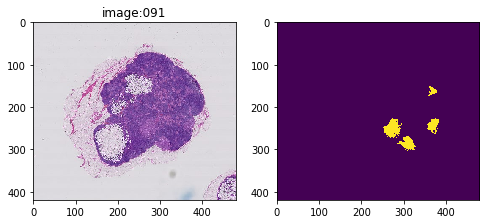

In [0]:
#test opensilde works or not
image_list = ['091']
slides, tumor_masks = get_img_slide('091')

for i in range(len(slides)):
  # print('image:',image_list[i])
  slide, tumor_mask = slides[i], tumor_masks[i]
  fig, axes = plt.subplots(1,2, figsize=(8,8))
  slide_image = read_slide(slide, 
                          x=0, 
                          y=0, 
                          level=7, 
                          width=slide.level_dimensions[7][0], 
                          height=slide.level_dimensions[7][1])

  axes[0].set_title('image:{}'.format(image_list[i]))
  axes[0].imshow(slide_image)

  mask_image = read_slide(tumor_mask, 
                          x=0, 
                          y=0, 
                          level=7, 
                          width=slide.level_dimensions[7][0], 
                          height=slide.level_dimensions[7][1])

  mask_image = mask_image[:,:,0]
  axes[1].imshow(mask_image)


In [0]:
# See https://openslide.org/api/python/#openslide.OpenSlide.read_region
# Note: x,y coords are with respect to level 0.
# There is an example below of working with coordinates
# with respect to a higher zoom level.

# Read a region from the slide
# Return a numpy RBG array
def read_slide(slide, x, y, level, width, height, as_float=False):
    im = slide.read_region((x,y), level, (width, height))
    im = im.convert('RGB') # drop the alpha channel
    if as_float:
        im = np.asarray(im, dtype=np.float32)
    else:
        im = np.asarray(im)
    assert im.shape == (height, width, 3)
    return im
# As mentioned in class, we can improve efficiency by ignoring non-tissue areas 
# of the slide. We'll find these by looking for all gray regions.
def find_tissue_pixels(image, intensity=0.8):
    im_gray = rgb2gray(image)
    assert im_gray.shape == (image.shape[0], image.shape[1])
    indices = np.where(im_gray <= intensity)
    return zip(indices[0], indices[1])

# tissue_pixels = list(find_tissue_pixels(slide_image))
# percent_tissue = len(tissue_pixels) / float(slide_image.shape[0] * slide_image.shape[0]) * 100
# print ("%d tissue_pixels pixels (%.1f percent of the image)" % (len(tissue_pixels), percent_tissue)) 

def apply_mask(im, mask, color=(255,0,0)):
    masked = np.zeros(im.shape)
    for x,y in mask: masked[x][y] = color
    return masked

###get start to build dataset

##### get slides

In [0]:
#get images from paths
def get_img_slide(*args):
  slide_set = []
  tumor_mask_set = []
  for i in args:
    slide_path = "/content/drive/My Drive/slide_copy/Copy of tumor_{}.tif".format(i)
    tumor_mask_path = "/content/drive/My Drive/slide_copy/Copy of tumor_{}_mask.tif".format(i)
    img = open_slide(slide_path)
    slide_set.append(img)
    tu = open_slide(tumor_mask_path)
    tumor_mask_set.append(tu)
  # return a list of slides and masks
  return slide_set, tumor_mask_set

In [0]:
# get one patch with coordinates and level
def get_one_patch(slide, tumor_mask,level_n, x0, y0, patch_size): # from level and coodinate to get one patch
  downsample_factor = 2**level_n
  patch_image = read_slide(slide,
                             x = x0-(patch_size//2)*downsample_factor,
                             y = y0-(patch_size//2)*downsample_factor, 
                             level = level_n,
                             width = patch_size,
                             height = patch_size)
  patch_mask = read_slide(tumor_mask,
                            x = x0-(patch_size//2)*downsample_factor,
                            y = y0-(patch_size//2)*downsample_factor, 
                            level = level_n,
                            width = patch_size,
                            height = patch_size)
  patch_mask = patch_mask[:,:,0]

  tissue_pixels = find_tissue_pixels(patch_image)
  patch_tissue = apply_mask(patch_image, tissue_pixels)

  return patch_image, patch_mask, patch_tissue

# plot one patch and its center region
def plot_patch(name,level_n, patch_center,patch_image, patch_mask, patch_tissue):
  patch_size = patch_image.shape[0]

  offset = int((patch_size-patch_center)/2)
  

  tissue_ratio = np.sum(patch_tissue[:,:,0])/(patch_size**2)
  
  fig, axes = plt.subplots(1,2, figsize=(10,5))
  
  cmap = plt.cm.viridis

 
  v_min, v_max = 0, 1
  colors = Normalize(v_min, v_max)(patch_mask)
  colors = cmap(colors)

  colors[..., -1] = patch_mask
  a = axes[0]
  a.set_title("image:{}".format(name))
  a.imshow(patch_image)

  a.grid(False)


  a = axes[1]
  a.imshow(patch_image)
  a.grid(False)
  a.imshow(colors, cmap='viridis', vmin=v_min, vmax=v_max, alpha=0.8)
  a.plot([offset, offset+patch_center, offset+patch_center, offset, offset],
                [offset, offset, offset+patch_center, offset+patch_center, offset], 'g')
  a.set_title('Caner region in the center, level:{}'.format(level_n))


  plt.show()

In [0]:
# check if its center has cancer cell
def check_cancer(patch_mask,center_size):

  patch_size = patch_mask.shape[0]
  

  offset = (patch_size-center_size)//2
  sum_cancers = np.sum(patch_mask[offset:offset+center_size, offset:offset+center_size])
  # if sum_cencers > 0, then it contains cancers
  return sum_cancers>0  # if have return true 

In [0]:
# for one slide and tumor_mask, get a total set of patches at its level
# get patches from 3 levels, and store them into 3 dataset.
def get_patches(name,slide,tumor_mask, level_1, level_2, level_3):
  patch_images_1 = []
  patch_images_2 = []
  patch_images_3 = []
  patch_lables = []
  num_cancer = 0
  x_one_step =  128
  y_one_step =  128

  # x_steps = slide.level_dimensions[level_n][1]//x_one_step
  # y_steps = slide.level_dimensions[level_n][0]//y_one_step

  slide_image = read_slide(slide, 
                            x=0, 
                            y=0, 
                            level=4, 
                            width=slide.level_dimensions[4][0], 
                            height=slide.level_dimensions[4][1])

  mask_image = read_slide(tumor_mask, 
                    x=0, 
                    y=0, 
                    level=4, 
                    width=slide.level_dimensions[4][0], 
                    height=slide.level_dimensions[4][1])

  mask_image = mask_image[:,:,0]

  mask_4_cancer = np.nonzero(mask_image)
  tissue_pixels = list(find_tissue_pixels(slide_image))
  percent_tissue = len(tissue_pixels) / float(slide_image.shape[0] * slide_image.shape[0]) * 100
  tissue_regions = apply_mask(slide_image, tissue_pixels)

  mask_health = tissue_regions[:,:,0]-mask_image
  mask_health = mask_health>0
  mask_health = mask_health.astype('int')
  mask_4_health = np.nonzero(mask_health)
  

#get cancer sample. From image slide, random select points
  sample_cancer = random.sample(list(zip(mask_4_cancer[1], mask_4_cancer[0])), 500)
 
  total_num = 200  #every silde, each level, choosing 200 pictures for cancer and Non-cancer
  patch_size = 299
  patch_center = 128
  cancer_total_num = 0
  while cancer_total_num < total_num:
    (x, y) = sample_cancer[cancer_total_num]
    x0, y0 = x*(2**4), y*(2**4)
    #extract patch at level_1
    patch_image_1, patch_mask_1, patch_tissue_1 = get_one_patch(slide, tumor_mask,level_1, x0, y0,  299)
    cancer_total_num += 1
    patch_size = patch_mask_1.shape[0]
    offset = (patch_size-patch_center)//2

    sum_cancers = np.sum(patch_mask_1[offset:offset+patch_center, offset:offset+patch_center]) 

    sum_cancers = sum_cancers > 0
    if sum_cancers:
      num_cancer += 1
      patch_images_1.append(patch_image_1)
      patch_lables.append(1)
      # for each center, get patch from 3 levels and put them into its dataset
      #extract patch at level_2
      patch_image_2, patch_mask_2, patch_tissue_2 = get_one_patch(slide, tumor_mask,level_2, x0, y0,  299)
      patch_images_2.append(patch_image_2) 

      #extract patch at level_3
      patch_image_3, patch_mask_3, patch_tissue_3 = get_one_patch(slide, tumor_mask,level_3, x0, y0,  299)
      patch_images_3.append(patch_image_3) 

      if len(patch_lables)%total_num==0:

        plot_patch(name,level_1, patch_center, patch_image_1, patch_mask_1, patch_tissue_1)
        plot_patch(name,level_2, patch_center, patch_image_2, patch_mask_2, patch_tissue_2)
        plot_patch(name,level_3, patch_center, patch_image_3, patch_mask_3, patch_tissue_3) 

#get healthy sample
  sample_healthy = random.sample(list(zip(mask_4_health[1], mask_4_health[0])), 500)

  healthy_total_num = 0
  while healthy_total_num < total_num:
    (x, y) = sample_healthy[healthy_total_num]
    x0, y0 = x*(2**4), y*(2**4)
    patch_image_1, patch_mask_1, patch_tissue_1 = get_one_patch(slide, tumor_mask,level_1, x0, y0, 299)
    healthy_total_num += 1
    patch_size = patch_mask_1.shape[0]
    offset = (patch_size-patch_center)//2

    sum_cancers = np.sum(patch_mask_1[offset:offset+patch_center, offset:offset+patch_center])
    sum_cancers = sum_cancers > 0
    if not sum_cancers:
      num_cancer += 1
      patch_images_1.append(patch_image_1)
      patch_lables.append(0)
      #extract patch at level_2
      patch_image_2, patch_mask_2, patch_tissue_2 = get_one_patch(slide, tumor_mask,level_2, x0, y0,  299)
      patch_images_2.append(patch_image_2) 

      #extract patch at level_3
      patch_image_3, patch_mask_3, patch_tissue_3 = get_one_patch(slide, tumor_mask,level_3, x0, y0,  299)
      patch_images_3.append(patch_image_3)
      if len(patch_lables)%total_num==0:

        plot_patch(name,level_1, patch_center, patch_image_1, patch_mask_1, patch_tissue_1)
        plot_patch(name,level_2, patch_center, patch_image_2, patch_mask_2, patch_tissue_2)
        plot_patch(name,level_3, patch_center, patch_image_3, patch_mask_3, patch_tissue_3)        
      
  return patch_images_1, patch_images_2, patch_images_3, patch_lables

In [0]:
# get a list of patches of mutiple images and levels
#get data from different images 
def all_patches(image_list,slides, tumor_masks, level_1, level_2, level_3):
  patch_images_1 = []
  patch_images_2 = []
  patch_images_3 = []
  patch_lables = []
  for i in range(len(slides)):

    images_1, images_2, images_3, lables = get_patches(image_list[i],slides[i],tumor_masks[i], level_1, level_2, level_3)     
    patch_images_1 += images_1
    patch_images_2 += images_2
    patch_images_3 += images_3     
    patch_lables += lables
  return patch_images_1, patch_images_2, patch_images_3, patch_lables

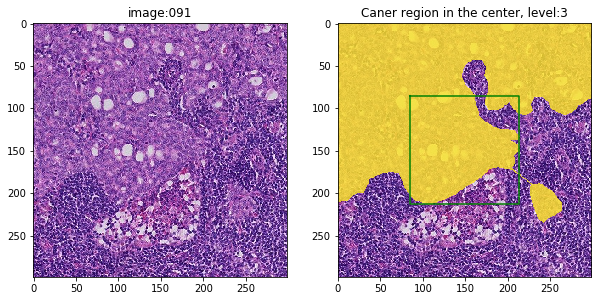

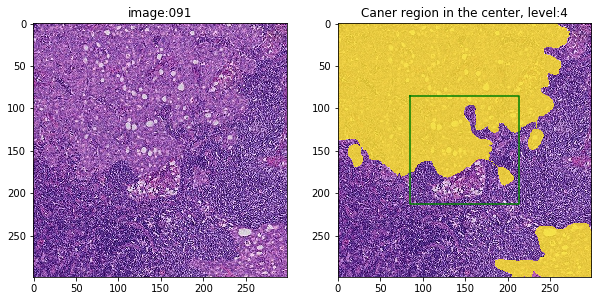

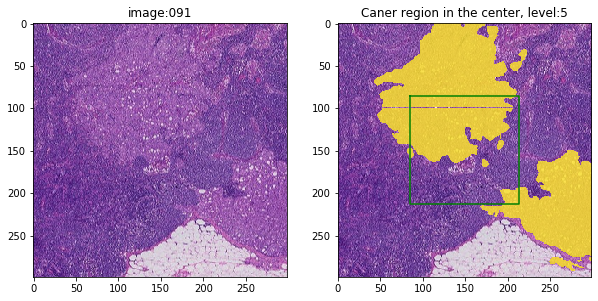

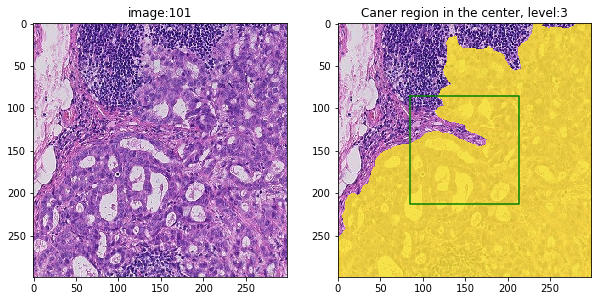

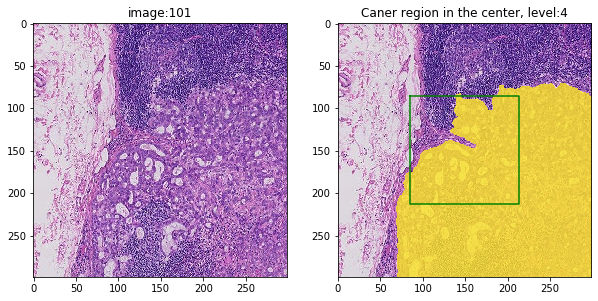

...

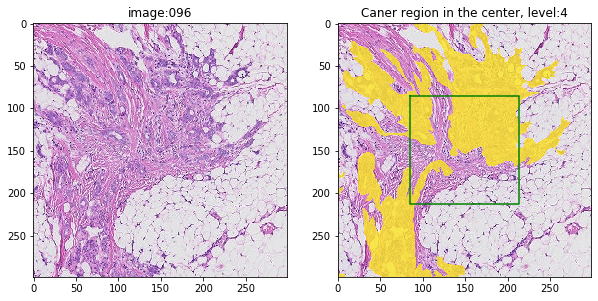

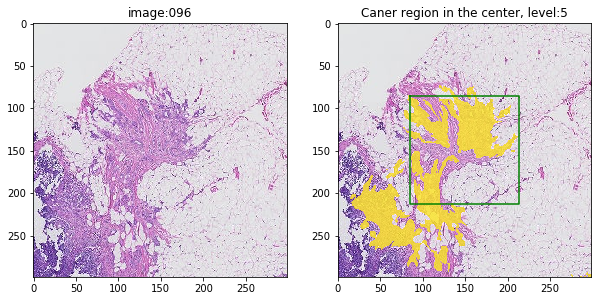

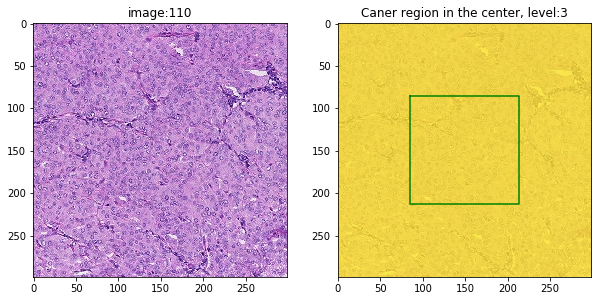

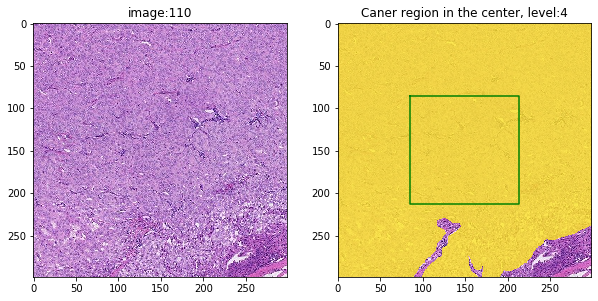

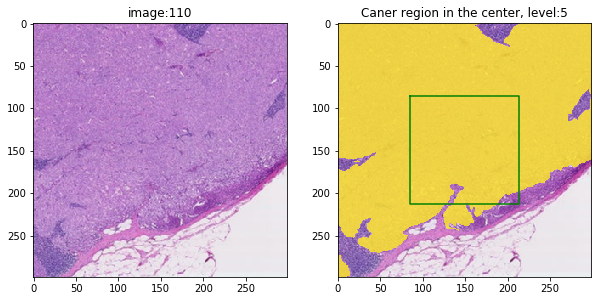

In [0]:
#9 images for training set and one for test set 
image_list = ['091','101','084','016','094','078','075','031','096']
test_list = ['110']
slides, tumor_masks = get_img_slide('091','101','084','016','094','078','075','031','096')
level_1, level_2, level_3 = 3, 4, 5
patch_images_1, patch_images_2, patch_images_3, patch_lables = all_patches(image_list,slides, tumor_masks, level_1, level_2, level_3)
slides_test, tumor_masks_test = get_img_slide('110')
patch_images_test_1, patch_images_test_2, patch_images_test_3, patch_test_lables = all_patches(test_list,slides_test, tumor_masks_test, level_1, level_2, level_3)
patch_images_1 = np.asarray(patch_images_1)
patch_images_2 = np.asarray(patch_images_2)
patch_images_3 = np.asarray(patch_images_3)
patch_lables = np.asarray(patch_lables)

X_1_test = np.asarray(patch_images_test_1)
X_2_test = np.asarray(patch_images_test_2)
X_3_test = np.asarray(patch_images_test_3)
y_test = np.asarray(patch_test_lables)

In [0]:
# print('total training and validation set size:',patch_images.shape, 'lable size:',patch_lables.shape)
# the percentage of train and validation is 4 to 1 
X_1_train, X_1_val, y_1_train, y_1_val = train_test_split(patch_images_1, patch_lables, test_size=0.2, random_state=42, stratify=patch_lables, shuffle=True)
X_2_train, X_2_val, y_2_train, y_2_val = train_test_split(patch_images_2, patch_lables, test_size=0.2, random_state=42, stratify=patch_lables, shuffle=True)
X_3_train, X_3_val, y_3_train, y_3_val = train_test_split(patch_images_3, patch_lables, test_size=0.2, random_state=42, stratify=patch_lables, shuffle=True)
print('training size_1:',X_1_train.shape, y_1_train.shape, 'validation size:',X_1_val.shape, y_1_val.shape)
print('training size_2:',X_2_train.shape, y_2_train.shape, 'validation size:',X_2_val.shape, y_2_val.shape)
print('training size_3:',X_3_train.shape, y_3_train.shape, 'validation size:',X_3_val.shape, y_3_val.shape)

training size_1: (2652, 299, 299, 3) (2652,) validation size: (664, 299, 299, 3) (664,)
training size_2: (2652, 299, 299, 3) (2652,) validation size: (664, 299, 299, 3) (664,)
training size_3: (2652, 299, 299, 3) (2652,) validation size: (664, 299, 299, 3) (664,)


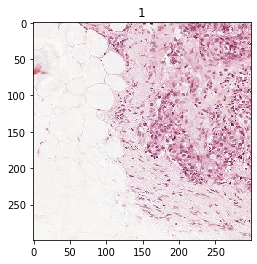

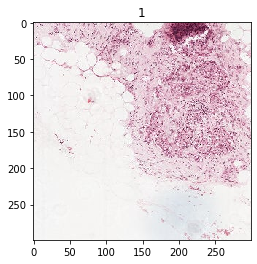

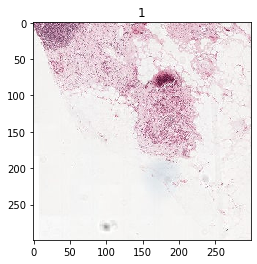

In [0]:
# test if it is the same center in 3 levels
plt.imshow(X_1_train[500])
plt.title(y_1_train[500])
plt.show()

plt.imshow(X_2_train[500])
plt.title(y_2_train[500])
plt.show()

plt.imshow(X_3_train[500])
plt.title(y_3_train[500])
plt.show()

In [0]:
# delete unnecessary variables
del patch_images_1, patch_images_2, patch_images_3, patch_lables
del patch_images_test_1, patch_images_test_2, patch_images_test_3, patch_test_lables

In [0]:
X_1_train_filename = '/content/drive/My Drive/adl/final_data/X_1_train_file.npy'
X_2_train_filename = '/content/drive/My Drive/adl/final_data/X_2_train_file.npy'
X_3_train_filename = '/content/drive/My Drive/adl/final_data/X_3_train_file.npy'

X_1_val_filename = '/content/drive/My Drive/adl/final_data/X_1_val_file.npy'
X_2_val_filename = '/content/drive/My Drive/adl/final_data/X_2_val_file.npy'
X_3_val_filename = '/content/drive/My Drive/adl/final_data/X_3_val_file.npy'

y_train_filename = '/content/drive/My Drive/adl/final_data/y_trian_file.npy'
y_val_filename = '/content/drive/My Drive/adl/final_data/y_val_file.npy'

X_1_test_filename = '/content/drive/My Drive/adl/final_data/X_1_test_file.npy'
X_2_test_filename = '/content/drive/My Drive/adl/final_data/X_2_test_file.npy'
X_3_test_filename = '/content/drive/My Drive/adl/final_data/X_3_test_file.npy'
y_test_filename = '/content/drive/My Drive/adl/final_data/y_test_file.npy'


In [0]:
#save data
np.save(X_1_train_filename, X_1_train)
np.save(X_2_train_filename, X_2_train)
np.save(X_3_train_filename, X_3_train)

np.save(X_1_val_filename, X_1_val)
np.save(X_2_val_filename, X_2_val)
np.save(X_3_val_filename, X_3_val)

np.save(y_train_filename, y_1_train)
np.save(y_val_filename, y_1_val)

np.save(X_1_test_filename, X_1_test)
np.save(X_2_test_filename, X_2_test)
np.save(X_3_test_filename, X_3_test)
np.save(y_test_filename, y_test)

In [0]:
#load data
X_1_train = np.load(X_1_train_filename)
X_2_train = np.load(X_2_train_filename)
X_3_train = np.load(X_3_train_filename)

X_1_val = np.load(X_1_val_filename)
X_2_val = np.load(X_2_val_filename)
X_3_val = np.load(X_3_val_filename)

y_1_train = y_2_train = y_3_train = np.load(y_train_filename)
y_1_val = y_2_val = y_3_val = np.load(y_val_filename)

X_1_test = np.load(X_1_test_filename)
X_2_test = np.load(X_2_test_filename)
X_3_test = np.load(X_3_test_filename)
y_test = np.load(y_test_filename)


In [0]:
# each level. train size is 2652 validation size is 664 test size is 281
print('training size_1:',X_1_train.shape, y_1_train.shape, 'validation size:',X_1_val.shape, y_1_val.shape)
print('training size_2:',X_2_train.shape, y_2_train.shape, 'validation size:',X_2_val.shape, y_2_val.shape)
print('training size_3:',X_3_train.shape, y_3_train.shape, 'validation size:',X_3_val.shape, y_3_val.shape)
print('test_size', X_1_test.shape)

training size_1: (2652, 299, 299, 3) (2652,) validation size: (664, 299, 299, 3) (664,)
training size_2: (2652, 299, 299, 3) (2652,) validation size: (664, 299, 299, 3) (664,)
training size_3: (2652, 299, 299, 3) (2652,) validation size: (664, 299, 299, 3) (664,)
test_size (281, 299, 299, 3)


In [0]:
def rescale(x):
  x = x.astype(float)
  x /= 255.
  return x
#modify the data generator for 3 inputs
def data_generator(X1, X2, X3, y):
  X1 = rescale(X1)
  X2 = rescale(X2)
  X3 = rescale(X3)

  #shuffle indices
  while True:
    index = np.random.permutation(X1.shape[0])
    datagen = ImageDataGenerator()

    batches = datagen.flow(X1[index], y[index], batch_size = 32)
    idx0 = 0
    for batch in batches:
      idx1 = idx0 + batch[0].shape[0]
      yield [batch[0], X2[index[idx0:idx1]], X3[index[idx0:idx1]]], batch[1]
      idx0 = idx1
      if idx1 >= X1.shape[0]:
        break
train_generator = data_generator(X_1_train, X_2_train, X_3_train, y_1_train)
val_generator = data_generator(X_1_val, X_2_val, X_3_val, y_1_val)
test_generator = data_generator(X_1_test, X_2_test, X_3_test, y_test)

In [0]:
from tensorflow.keras.layers import Dense, Embedding, Flatten, Input, Conv2D, MaxPooling2D, GlobalAveragePooling2D, BatchNormalization, Activation
from tensorflow.keras.models import Model, Sequential
# define 3 inputs 
image_input_1 = Input(shape=(299,299,3)) 
image_input_2 = Input(shape=(299,299,3)) 
image_input_3 = Input(shape=(299,299,3)) 

model_level_1 = Sequential()
model_level_1.add(Conv2D(32, kernel_size=(3, 3), padding='same'))
model_level_1.add(BatchNormalization())
model_level_1.add(Activation('relu'))
model_level_1.add(MaxPooling2D(pool_size=(2, 2)))
model_level_1.add(Conv2D(64, kernel_size=(3, 3), padding='same'))
model_level_1.add(BatchNormalization())
model_level_1.add(Activation('relu'))
model_level_1.add(MaxPooling2D(pool_size=(2, 2)))
model_level_1.add(Conv2D(64, kernel_size=(3, 3), padding='same'))
model_level_1.add(BatchNormalization())
model_level_1.add(Activation('relu'))
model_level_1.add(MaxPooling2D(pool_size=(2, 2)))
model_1_output = model_level_1(image_input_1) 

model_level_2 = Sequential()
model_level_2.add(Conv2D(32, kernel_size=(3, 3), padding='same'))
model_level_2.add(BatchNormalization())
model_level_2.add(Activation('relu'))
model_level_2.add(MaxPooling2D(pool_size=(2, 2)))
model_level_2.add(Conv2D(64, kernel_size=(3, 3), padding='same'))
model_level_2.add(BatchNormalization())
model_level_2.add(Activation('relu'))
model_level_2.add(MaxPooling2D(pool_size=(2, 2)))
model_level_2.add(Conv2D(64, kernel_size=(3, 3), padding='same'))
model_level_2.add(BatchNormalization())
model_level_2.add(Activation('relu'))
model_level_2.add(MaxPooling2D(pool_size=(2, 2)))
model_2_output = model_level_2(image_input_2) 

model_level_3 = Sequential()
model_level_3.add(Conv2D(32, kernel_size=(3, 3), padding='same'))
model_level_3.add(BatchNormalization())
model_level_3.add(Activation('relu'))
model_level_3.add(MaxPooling2D(pool_size=(2, 2)))
model_level_3.add(Conv2D(64, kernel_size=(3, 3), padding='same'))
model_level_3.add(BatchNormalization())
model_level_3.add(Activation('relu'))
model_level_3.add(MaxPooling2D(pool_size=(2, 2)))
model_level_3.add(Conv2D(64, kernel_size=(3, 3), padding='same'))
model_level_3.add(BatchNormalization())
model_level_3.add(Activation('relu'))
model_level_3.add(MaxPooling2D(pool_size=(2, 2)))
model_3_output = model_level_3(image_input_3) 


# cancatenate 3 activations of 3 inputs
merged = tf.keras.layers.concatenate([model_1_output, model_2_output, model_3_output])
output = Flatten()(merged)
output = Dense(8, activation='relu')(output) # add one dense layer to merge 3 inputs 
output = Dense(1, activation='sigmoid')(output)

#final model
model = Model(inputs=[image_input_1, image_input_2, image_input_3], outputs=output)

In [0]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
sequential_1 (Sequential)       (None, 37, 37, 64)   56960       input_2[0][0]                    
______________________________________________________________________________________________

In [0]:
model.compile(optimizer='adam',
                     loss='binary_crossentropy',
                     metrics=['accuracy'])

In [0]:
#epoch is 15
history = model.fit_generator(train_generator, steps_per_epoch=len(X_1_train)//32, epochs=15,validation_data=val_generator, validation_steps = len(X_1_train)//32)

Epoch 1/15
54/54 [==============================] - 45s 841ms/step - loss: 1.1062 - acc: 0.7045 - val_loss: 577.4154 - val_acc: 0.5675
Epoch 2/15
54/54 [==============================] - 17s 313ms/step - loss: 0.3156 - acc: 0.9073 - val_loss: 1606.0386 - val_acc: 0.5675
Epoch 3/15
54/54 [==============================] - 17s 313ms/step - loss: 0.1865 - acc: 0.9528 - val_loss: 38.9808 - val_acc: 0.5400
Epoch 4/15
54/54 [==============================] - 17s 313ms/step - loss: 0.1822 - acc: 0.9569 - val_loss: 6.4259 - val_acc: 0.7757
Epoch 5/15
54/54 [==============================] - 17s 314ms/step - loss: 0.0940 - acc: 0.9790 - val_loss: 3.9091 - val_acc: 0.9336
Epoch 6/15
54/54 [==============================] - 17s 313ms/step - loss: 0.0751 - acc: 0.9784 - val_loss: 1.6421 - val_acc: 0.9657
Epoch 7/15
54/54 [==============================] - 17s 313ms/step - loss: 0.0601 - acc: 0.9802 - val_loss: 0.0135 - val_acc: 0.9977
Epoch 8/15
54/54 [==============================] - 17s 314ms/s

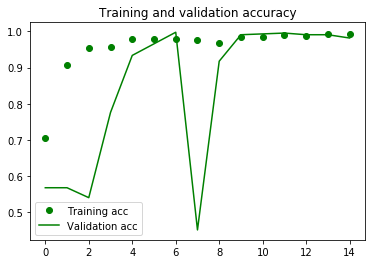

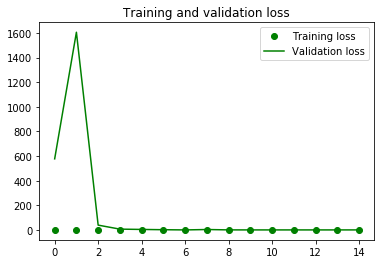

In [0]:
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'go', label='Training acc')
plt.plot(epochs, val_acc, 'g', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'go', label='Training loss')
plt.plot(epochs, val_loss, 'g', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

# the validation accuracy is unstable because of the dataset

In [0]:
test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)
print('Test loss: %.3f, accuracy: %.3f' % (test_loss, test_acc))
# the test accuracy is 0.977

Test loss: 0.165, accuracy: 0.977


In [0]:
def plot_heatmap(mask_image, slide_image, heatmap):
  fig, axes = plt.subplots(1,2, figsize=(10,10), dpi=100)
  
  cmap = plt.cm.Greys

  # normalize the mask between 0 and 1
  v_min, v_max = 0, 1
  colors = Normalize(v_min, v_max)(mask_image)
  colors = cmap(colors)
  colors[..., -1] = mask_image/np.max(mask_image)

  a = axes[0]
  a.imshow(slide_image)
  a.imshow(colors, vmin=v_min, vmax=v_max, alpha=0.8)
  a.set_xticks([]), axes[0].set_yticks([])

  
  a = axes[1]
  
  v_min, v_max = 0, 1
  colors = Normalize(v_min, v_max)(heatmap)
  colors = cmap(colors)
  colors[..., -1] = heatmap/np.max(heatmap)
  a.imshow(slide_image)
  a.imshow(colors, vmin=v_min, vmax=v_max, alpha=0.8)
  a.set_xticks([]), axes[1].set_yticks([])
  plt.show()

In [0]:
def get_heatmap(slide, tumor_mask, level_1, level_2, level_3):

  slide_image = read_slide(slide, 
                            x=0, 
                            y=0, 
                            level=7, 
                            width=slide.level_dimensions[7][0], 
                            height=slide.level_dimensions[7][1])

  mask_image = read_slide(tumor_mask, 
                    x=0, 
                    y=0, 
                    level=7, 
                    width=slide.level_dimensions[7][0], 
                    height=slide.level_dimensions[7][1])

  mask_image = mask_image[:,:,0]
  tissue_pixels = list(find_tissue_pixels(slide_image))
  percent_tissue = len(tissue_pixels) / float(slide_image.shape[0] * slide_image.shape[0]) * 100
  print ("%d tissue_pixels pixels (%.1f percent of the image)" % (len(tissue_pixels), percent_tissue)) 
  tissue_regions = apply_mask(slide_image, tissue_pixels)


  heatmap = np.zeros(slide_image.shape[:2])

  stride = 2**level_1
  heatmap_offset = stride//2

  heat_x = []
  heat_y = []
  n =1
  strips_1, strips_2, strips_3 = [], [], []
  cancer_all, predict_all = [],[]
  for x in range(stride*2, slide.level_dimensions[7][1]-3*stride, stride):
    for y in range(stride*2, slide.level_dimensions[7][0]-3*stride, stride):
      x0 = x*(2**7)
      y0 = y*(2**7)
      if tissue_regions[x, y, 0] > 0:
        heat_x.append(x)
        heat_y.append(y)
        patch_image_1, patch_mask_1,_ = get_one_patch(slide, tumor_mask,level_1, y0, x0, 299)
        strips_1.append(patch_image_1)
        #true lable
        has_cancer = check_cancer(patch_mask_1, 128)
        cancer_all.append(has_cancer)

        patch_image_2, patch_mask_2,_ = get_one_patch(slide, tumor_mask,level_2, y0, x0, 299)
        strips_2.append(patch_image_2)

        patch_image_3, patch_mask_3,_ = get_one_patch(slide, tumor_mask,level_3, y0, x0, 299)
        strips_3.append(patch_image_3)
# generate 3 inputs for heapmap 
        if len(strips_1) == 1000:
          X1 = rescale(np.asarray(strips_1))
          X2 = rescale(np.asarray(strips_2))
          X3 = rescale(np.asarray(strips_3))
          my_pred = model.predict([X1, X2, X3])
          predict_all.extend(my_pred)

          strips_1, strips_2, strips_3 = [], [], []

  X1 = rescale(np.asarray(strips_1))
  X2 = rescale(np.asarray(strips_2))
  X3 = rescale(np.asarray(strips_3))
  my_pred = model.predict([X1, X2, X3])
  predict_all.extend(my_pred)

          
  for i in range(len(predict_all)):
    heatmap[heat_x[i]-heatmap_offset:heat_x[i]+heatmap_offset, heat_y[i]-heatmap_offset:heat_y[i]+heatmap_offset] = predict_all[i]
  print('heatmap length',len(heatmap))
  plot_heatmap(mask_image, slide_image, heatmap)


215836 tissue_pixels pixels (28.6 percent of the image)
heatmap length 868


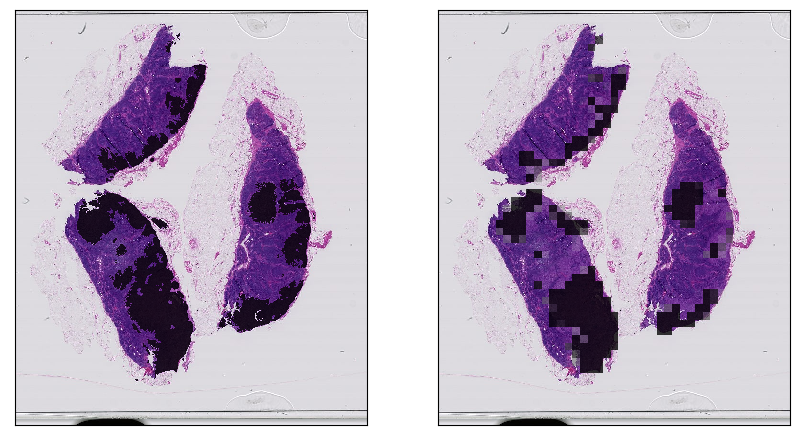

120038 tissue_pixels pixels (38.3 percent of the image)
heatmap length 560


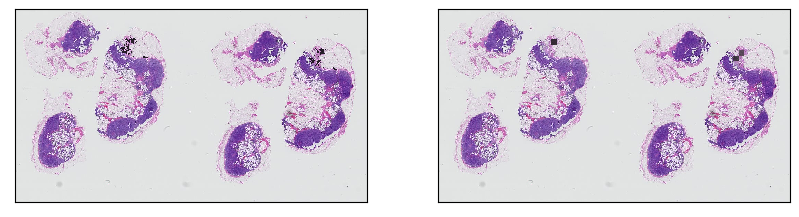

In [0]:
# we use 2 images to draw heatmap
slides, tumor_masks = get_img_slide('078', '096')
for i in range(len(slides)):
  get_heatmap(slides[i], tumor_masks[i], level_1, level_2, level_3)